In [1]:
try:
    from somu import som
except ImportError:
    from torchsom import som
    print("Failed to import somu. Falling back to the torch implementation.")

import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import torchvision.datasets as datasets
import matplotlib.offsetbox as offsetbox

np.random.seed(123)	

In [2]:
X = datasets.MNIST(root='/tmp/mnist', train=True, download=True)
X = X.data.numpy().reshape(-1, 28*28).astype(float) / 255.0

dim = 3
units = np.random.randn(400, 3)
centroids = som(X, units, iters=20000, seed=123, batch_size=512, sigma_initial=1)
X.shape

(60000, 784)

In [3]:
fig = plt.figure(figsize=(28, 28))
ax = fig.add_subplot(111, projection='3d')

for i in np.random.choice(np.arange(len(centroids)), 64, replace=False): #len(centroids)):
    x, y, z = units[i]  # Get the coordinates of the unit in 3D space
    img = centroids[i].reshape(28, 28)


    rgba = np.zeros((28, 28, 4))
    rgba[:,:,3] = img  # Alpha channel - transparent where white (0), opaque where black (1)
    

    img_size = 0.5
    xx, zz = np.meshgrid(np.linspace(-img_size/2, img_size/2, 28), 
                         np.linspace(-img_size/2, img_size/2, 28))
    
    yy = np.ones_like(xx) * y
    
    ax.plot_surface(xx + x, yy, -zz-z, rstride=1, cstride=1, facecolors=rgba, shade=False)
    ax.set_box_aspect([1, 1, 1])

ax.grid(True)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.set_title('3D Centroid Images')
plt.show()

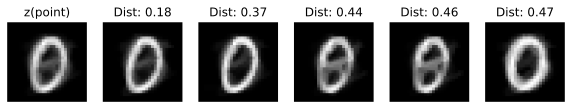

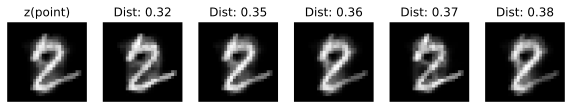

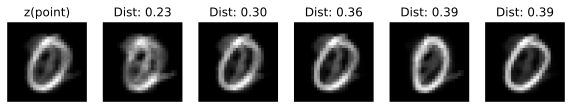

In [4]:
num_samples = 3  # Number of random points to sample
k = 5  # Number of closest centroids to display

for _ in range(num_samples):
    # Sample a random point from a normal distribution
    point = np.random.normal(0, 1, size=dim)

    # Calculate distances from the point to all units
    dists = np.linalg.norm(units - point, axis=1)

    # Get the indices of the k closest centroids
    topk_indices = np.argsort(dists)[:k]
    topk_coords = centroids[topk_indices]
    topk_dists = dists[topk_indices]

    # Calculate z(point) by combining the topk centroids weighted by distances
    z = (topk_dists @ topk_coords) / sum(topk_dists)

    # Plot the first image as z(point)
    plt.figure(figsize=(10, 5))

    # Plot z(point) image
    plt.subplot(1, k + 1, 1)
    plt.imshow(z.reshape(28, 28), cmap='gray')
    plt.axis('off')
    plt.title("z(point)")

    # Plot the top k closest centroids and their corresponding distances
    for i in range(k):
        plt.subplot(1, k + 1, i + 2)
        plt.imshow(centroids[topk_indices[i]].reshape(28, 28), cmap='gray')
        plt.axis('off')
        plt.title(f"Dist: {topk_dists[i]:.2f}")

    plt.show()